In [4]:
import os

**<font coloe = whilt size=5 face=雅黑>1. RENAME</font>**

In [5]:
def rename():
    i = 74
    path = r"D:\\Code_py_StrokeClassification\\Facial\\2_DynamicFace\\data_create\\dynamic_teeth_processed"

    filelist = os.listdir(path)
    for files in filelist:
        i = i + 1
        Olddir = os.path.join(path, files)
        if os.path.isdir(Olddir):
            continue
        filetype = ".mp4"
        Newdir = os.path.join(path, str(i) + filetype)
        os.rename(Olddir, Newdir)
    return True
        

In [6]:
rename()

FileExistsError: [WinError 183] 当文件已存在时，无法创建该文件。: 'D:\\\\Code_py_StrokeClassification\\\\Facial\\\\2_DynamicFace\\\\data_create\\\\dynamic_teeth_processed\\100——使用Clipchamp制作.mp4' -> 'D:\\\\Code_py_StrokeClassification\\\\Facial\\\\2_DynamicFace\\\\data_create\\\\dynamic_teeth_processed\\75.mp4'

In [10]:
def split():
    path = r"D:\\Code_py_StrokeClassification\\Facial\\2_DynamicFace\\data_create\\dynamic_teeth_processed"
    filelist = os.listdir(path)
    for files in filelist:
        Olddir = os.path.join(path,files)
        if os.path.isdir(Olddir):
            continue
        new = files.split('——')[0]
        filetype = ".mp4"
        Newdir = os.path.join(path, new + filetype)
        os.rename(Olddir,Newdir)
    return True

In [11]:
split()

True


**<font color = white size=5 face=雅黑>2. face_alignment</font>**

In [1]:
import math
import cv2
from PIL import Image, ImageDraw
from matplotlib.pyplot import imshow
import matplotlib.pyplot as plt
import face_recognition
from collections import defaultdict
import numpy as np
import os


In [3]:
def detect_landmark(image_array, model_type="large"):
    """ return landmarks of a given image array
    :param image_array: numpy array of a single image
    :param model_type: 'large' returns 68 landmarks; 'small' return 5 landmarks
    :return: dict of landmarks for facial parts as keys and tuple of coordinates as values
    """
    face_landmarks_list = face_recognition.face_landmarks(image_array, model=model_type)
    print(face_landmarks_list)
    if len(face_landmarks_list) > 0:
        face_landmarks_list = face_landmarks_list[0]
        return face_landmarks_list
    else:
        print('NO FACE')

In [4]:
def align_face(image_array, landmarks):

    """ align faces according to eyes position
    :param image_array: numpy array of a single image
    :param landmarks: dict of landmarks for facial parts as keys and tuple of coordinates as values
    :return:
    rotated_img:  numpy array of aligned image
    eye_center: tuple of coordinates for eye center
    angle: degrees of rotation
    """
    # get list landmarks of left and right eye
    left_eye = landmarks['left_eye']
    right_eye = landmarks['right_eye']
    # calculate the mean point of landmarks of left and right eye
    # #修改1
    left_eye_center = np.mean(left_eye, axis=0).astype("float")
    right_eye_center = np.mean(right_eye, axis=0).astype("float")
    # compute the angle between the eye centroids
    dy = right_eye_center[1] - left_eye_center[1]
    dx = right_eye_center[0] - left_eye_center[0]
    # compute angle between the line of 2 centeroids and the horizontal line
    angle = math.atan2(dy, dx) * 180. / math.pi
    # calculate the center of 2 eyes
    eye_center = ((left_eye_center[0] + right_eye_center[0]) // 2,
                  (left_eye_center[1] + right_eye_center[1]) // 2)
    # at the eye_center, rotate the image by the angle
    rotate_matrix = cv2.getRotationMatrix2D(eye_center, angle, scale=1)
    rotated_img = cv2.warpAffine(image_array, rotate_matrix, (image_array.shape[1], image_array.shape[0]))
    return rotated_img, eye_center, angle

In [5]:
def rotate(origin, point, angle, row):
    """ rotate coordinates in image coordinate system
    :param origin: tuple of coordinates,the rotation center
    :param point: tuple of coordinates, points to rotate
    :param angle: degrees of rotation
    :param row: row size of the image
    :return: rotated coordinates of point
    """
    x1, y1 = point
    x2, y2 = origin
    y1 = row - y1
    y2 = row - y2
    angle = math.radians(angle)
    x = x2 + math.cos(angle) * (x1 - x2) - math.sin(angle) * (y1 - y2)
    y = y2 + math.sin(angle) * (x1 - x2) + math.cos(angle) * (y1 - y2)
    y = row - y
    return int(x), int(y)


In [6]:
def rotate_landmarks(landmarks, eye_center, angle, row):
    """ rotate landmarks to fit the aligned face
    :param landmarks: dict of landmarks for facial parts as keys and tuple of coordinates as values
    :param eye_center: tuple of coordinates for eye center
    :param angle: degrees of rotation
    :param row: row size of the image
    :return: rotated_landmarks with the same structure with landmarks, but different values
    """
    rotated_landmarks = defaultdict(list)
    for facial_feature in landmarks.keys():
        for landmark in landmarks[facial_feature]:
            rotated_landmark = rotate(origin=eye_center, point=landmark, angle=angle, row=row)
            rotated_landmarks[facial_feature].append(rotated_landmark)
    return rotated_landmarks

In [7]:
def corp_face(image_array, landmarks):
    """ crop face according to eye,mouth and chin position
    :param image_array: numpy array of a single image
    :param landmarks: dict of landmarks for facial parts as keys and tuple of coordinates as values
    :return:
    cropped_img: numpy array of cropped image
    """

    eye_landmark = np.concatenate([np.array(landmarks['left_eye']),
                                   np.array(landmarks['right_eye'])])
    eye_center = np.mean(eye_landmark, axis=0).astype("int")
    lip_landmark = np.concatenate([np.array(landmarks['top_lip']),
                                   np.array(landmarks['bottom_lip'])])
    lip_center = np.mean(lip_landmark, axis=0).astype("int")
    mid_part = lip_center[1] - eye_center[1]
    top = eye_center[1] - mid_part * 0.7
    bottom = lip_center[1] + mid_part*0.7

    w = h = bottom - top
    x_min = np.min(landmarks['chin'], axis=0)[0]
    x_max = np.max(landmarks['chin'], axis=0)[0]
    x_center = (x_max - x_min) / 2 + x_min
    left, right = (x_center - w / 2, x_center + w / 2.5)

    pil_img = Image.fromarray(image_array)
    left, top, right, bottom = [int(i) for i in [left, top, right, bottom]]
    cropped_img = pil_img.crop((left, top, right, bottom))
    cropped_img = np.array(cropped_img)
    return cropped_img, left, top

In [8]:
def transfer_landmark(landmarks, left, top):
    """transfer landmarks to fit the cropped face
    :param landmarks: dict of landmarks for facial parts as keys and tuple of coordinates as values
    :param left: left coordinates of cropping
    :param top: top coordinates of cropping
    :return: transferred_landmarks with the same structure with landmarks, but different values
    """
    transferred_landmarks = defaultdict(list)
    for facial_feature in landmarks.keys():
        for landmark in landmarks[facial_feature]:
            transferred_landmark = (landmark[0] - left, landmark[1] - top)
            transferred_landmarks[facial_feature].append(transferred_landmark)
    return transferred_landmarks

图像时使用

In [9]:
# def face_process(image, landmark_model_type='large'):
#     """ for a given image, do face alignment and crop face
#     :param image: numpy array of a single image
#     :param landmark_model_type: 'large' returns 68 landmarks; 'small' return 5 landmarks
#     :return:
#     cropped_face: image array with face aligned and cropped
#     transferred_landmarks: landmarks that fit cropped_face
#     """
#     # detect landmarks
#     face_landmarks_dict = detect_landmark(image_array=image, model_type=landmark_model_type)
#     if face_landmarks_dict is None:
#         return None, None
#     # rotate image array to align face
#     aligned_face, eye_center, angle = align_face(image_array=image, landmarks=face_landmarks_dict)
#     # rotate landmarks coordinates to fit the aligned face
#     rotated_landmarks = rotate_landmarks(landmarks=face_landmarks_dict,
#                                          eye_center=eye_center, angle=angle, row=image.shape[0])
#     # crop face according to landmarks
#     cropped_face, left, top = corp_face(image_array=aligned_face, landmarks=rotated_landmarks)
#     # transfer landmarks to fit the cropped face
#     transferred_landmarks = transfer_landmark(landmarks=rotated_landmarks, left=left, top=top)
#     # normalized_landmarks = normalize_landmarks(transferred_landmarks)
#     return cropped_face, transferred_landmarks

In [6]:
# def visualize_landmark(image_array, landmarks, save_folder):
#     """ plot landmarks on image
#     :param image_array: numpy array of a single image
#     :param landmarks: dict of landmarks for facial parts as keys and tuple of coordinates as values
#     :return: plots of images with landmarks on
#     """
#     if image_array is None:
#         return None, None
#     origin_img = Image.fromarray(image_array)
#     draw = ImageDraw.Draw(origin_img)
#     # for facial_feature in landmarks.keys():
#     #     draw.point(landmarks[facial_feature])
#     # imshow(origin_img
#     # plt.show()
#     image_array_bgr = np.array(origin_img)[:, :, ::-1]

#     filename = os.path.basename(image_path)
#     save_path = os.path.join(save_folder, filename)
#     cv2.imwrite(save_path, image_array_bgr)

视频时使用

In [9]:
def face_process_video(image, landmark_model_type='large'):
    """ for a given image, do face alignment and crop face
    :param image: numpy array of a single image
    :param landmark_model_type: 'large' returns 68 landmarks; 'small' return 5 landmarks
    :return:
    cropped_face: image array with face aligned and cropped
    transferred_landmarks: landmarks that fit cropped_face
    """
    # detect landmarks
    face_landmarks_dict = detect_landmark(image_array=image, model_type=landmark_model_type)
    if face_landmarks_dict is None:
        return None, None
    # rotate image array to align face
    aligned_face, eye_center, angle = align_face(image_array=image, landmarks=face_landmarks_dict)
    # rotate landmarks coordinates to fit the aligned face
    rotated_landmarks = rotate_landmarks(landmarks=face_landmarks_dict,
                                         eye_center=eye_center, angle=angle, row=image.shape[0])
    # crop face according to landmarks
    frame, left, top = corp_face(image_array=aligned_face, landmarks=rotated_landmarks)
    # transfer landmarks to fit the cropped face
    transferred_landmarks = transfer_landmark(landmarks=rotated_landmarks, left=left, top=top)
    # normalized_landmarks = normalize_landmarks(transferred_landmarks)
    return frame, None

以下方法创建出的.avi文件播放失败（跳过）

In [75]:
# def process_video(input_video_path, output_path):
#     # 打开视频文件
#     cap = cv2.VideoCapture(input_video_path)
#     frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
#     frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
#     fps = cap.get(cv2.CAP_PROP_FPS)
    
#     fourcc = cv2.VideoWriter_fourcc(*'XVID')
#     videoWriter = cv2.VideoWriter(output_path,fourcc,fps,(frame_width, frame_height))
#     count = 0
#     while True:
#         ret, frame = cap.read()
#         count += 1
#         if not ret:
#             break
#         frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
#         processed_frame, landmarks = face_process_video(image=frame_rgb, landmark_model_type='large')
#         if processed_frame is None:
#             return None, None
#         origin_img = Image.fromarray(processed_frame)
#         image_array_bgr = np.array(origin_img)[:, :, ::-1]
#         # filename = f"frame_{count}.jpg"
#         # save_path = os.path.join(output_path, filename) 
#         videoWriter.write(image_array_bgr)
        
      

#         # cv2.imwrite(save_path,image_array_bgr)        
#     cap.release()
#     videoWriter.release()
#     print("总帧数：", count)
#     print("finish")
    


以下方法将每一个视频的帧提取放入到对应的文件夹中

In [88]:
def process_video(input_video_path, output_path):
    # 打开视频文件
    cap = cv2.VideoCapture(input_video_path)
    count = 0
    while True:
        ret, frame = cap.read()
        count += 1
        if not ret:
            break
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        processed_frame, landmarks = face_process_video(image=frame_rgb, landmark_model_type='large')
        if processed_frame is None:
            return None, None
        origin_img = Image.fromarray(processed_frame)
        image_array_bgr = np.array(origin_img)[:, :, ::-1]
        filename = f"{count}.jpg"
        frame_output_path = os.path.join(output_path, filename)  

        cv2.imwrite(frame_output_path,image_array_bgr)        
    cap.release()
  
    print("总帧数：", count)
    print("finish")

In [22]:
# input_folder = 'D:\Code_py_StrokeClassification\Facial\1_StaticFace/facial_weakness_classification/aug/all'
# output_folder = './stroke_tooth_mark/stroke_tooth_mark/tf_image_set1'
# image_files = [f for f in os.listdir(input_folder)if f.endswith('.jpg')]
# for image_file in image_files:
#     image_path = os.path.join(input_folder, image_file)
#     img = cv2.imread(image_path)
#     img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
#     face, landmarks = face_process(image=img, landmark_model_type='large')
#     visualize_landmark(image_array=face, landmarks=landmarks, save_folder=output_folder)

In [89]:
input_folder = 'D:\\Code_py_StrokeClassification\\Facial\\2_DynamicFace\\data_create\\dynamic_teeth_processed'
output_folder = 'D:\\Code_py_StrokeClassification\Facial\\2_DynamicFace\\data_create\\face_teeth_processed'
input_videos = os.listdir(input_folder)
input_videos.sort(key=lambda x: int(x.split('.')[0]))
input_videos
for video_file in input_videos:
    print("处理视频编号：", video_file.split('.')[0])
    video_input_path = os.path.join(input_folder, video_file)
    print(video_input_path)
    output_path = os.path.join(output_folder,f"{video_file.split('.')[0]}")
    os.makedirs(output_path, exist_ok=True)
    print(output_path)
    process_video(video_input_path, output_path)
    # if video_file.endswith('.mp4'):
    #     parts = video_file.split('.')[0]
    #     video_input_path = os.path.join(input_folder, video_file)

# process_video(input_folder, output_folder)

处理视频编号： 75
D:\Code_py_StrokeClassification\Facial\2_DynamicFace\data_create\dynamic_teeth_processed\75.mp4
D:\Code_py_StrokeClassification\Facial\2_DynamicFace\data_create\face_teeth_processed\75
[{'chin': [(243, 577), (246, 609), (252, 642), (260, 675), (274, 707), (294, 735), (319, 759), (350, 776), (386, 777), (420, 768), (448, 747), (471, 720), (488, 687), (499, 652), (502, 615), (502, 577), (500, 539)], 'left_eyebrow': [(257, 528), (268, 509), (288, 499), (312, 497), (333, 502)], 'right_eyebrow': [(370, 494), (391, 483), (416, 478), (440, 482), (460, 496)], 'nose_bridge': [(355, 527), (356, 548), (358, 569), (359, 592)], 'nose_tip': [(333, 611), (348, 615), (365, 617), (382, 610), (397, 603)], 'left_eye': [(281, 547), (294, 540), (309, 537), (326, 540), (311, 544), (296, 546)], 'right_eye': [(391, 529), (405, 521), (420, 519), (436, 522), (422, 526), (407, 528)], 'top_lip': [(320, 673), (332, 647), (353, 636), (369, 637), (386, 632), (411, 636), (431, 657), (424, 657), (388, 644),

尝试帧合成视频

In [28]:
# im_dir = 'D:\\Code_py_StrokeClassification\\Facial\\2_DynamicFace\\data_create\\face_teeth_processed\\75'
# im_frames = os.listdir(im_dir)
# im_frames

['frame_1.jpg',
 'frame_10.jpg',
 'frame_11.jpg',
 'frame_12.jpg',
 'frame_13.jpg',
 'frame_14.jpg',
 'frame_15.jpg',
 'frame_16.jpg',
 'frame_17.jpg',
 'frame_18.jpg',
 'frame_19.jpg',
 'frame_2.jpg',
 'frame_20.jpg',
 'frame_21.jpg',
 'frame_22.jpg',
 'frame_23.jpg',
 'frame_24.jpg',
 'frame_25.jpg',
 'frame_26.jpg',
 'frame_27.jpg',
 'frame_28.jpg',
 'frame_29.jpg',
 'frame_3.jpg',
 'frame_30.jpg',
 'frame_31.jpg',
 'frame_32.jpg',
 'frame_33.jpg',
 'frame_34.jpg',
 'frame_35.jpg',
 'frame_36.jpg',
 'frame_37.jpg',
 'frame_38.jpg',
 'frame_39.jpg',
 'frame_4.jpg',
 'frame_40.jpg',
 'frame_41.jpg',
 'frame_42.jpg',
 'frame_43.jpg',
 'frame_44.jpg',
 'frame_45.jpg',
 'frame_46.jpg',
 'frame_47.jpg',
 'frame_48.jpg',
 'frame_49.jpg',
 'frame_5.jpg',
 'frame_50.jpg',
 'frame_51.jpg',
 'frame_52.jpg',
 'frame_53.jpg',
 'frame_54.jpg',
 'frame_55.jpg',
 'frame_56.jpg',
 'frame_57.jpg',
 'frame_58.jpg',
 'frame_59.jpg',
 'frame_6.jpg',
 'frame_60.jpg',
 'frame_61.jpg',
 'frame_62.jpg',
 'f

In [53]:
# im_frames.sort(key=lambda x: int(x.split('_')[-1].split('.')[0]))
# im_frames

['frame_1.jpg',
 'frame_2.jpg',
 'frame_3.jpg',
 'frame_4.jpg',
 'frame_5.jpg',
 'frame_6.jpg',
 'frame_7.jpg',
 'frame_8.jpg',
 'frame_9.jpg',
 'frame_10.jpg',
 'frame_11.jpg',
 'frame_12.jpg',
 'frame_13.jpg',
 'frame_14.jpg',
 'frame_15.jpg',
 'frame_16.jpg',
 'frame_17.jpg',
 'frame_18.jpg',
 'frame_19.jpg',
 'frame_20.jpg',
 'frame_21.jpg',
 'frame_22.jpg',
 'frame_23.jpg',
 'frame_24.jpg',
 'frame_25.jpg',
 'frame_26.jpg',
 'frame_27.jpg',
 'frame_28.jpg',
 'frame_29.jpg',
 'frame_30.jpg',
 'frame_31.jpg',
 'frame_32.jpg',
 'frame_33.jpg',
 'frame_34.jpg',
 'frame_35.jpg',
 'frame_36.jpg',
 'frame_37.jpg',
 'frame_38.jpg',
 'frame_39.jpg',
 'frame_40.jpg',
 'frame_41.jpg',
 'frame_42.jpg',
 'frame_43.jpg',
 'frame_44.jpg',
 'frame_45.jpg',
 'frame_46.jpg',
 'frame_47.jpg',
 'frame_48.jpg',
 'frame_49.jpg',
 'frame_50.jpg',
 'frame_51.jpg',
 'frame_52.jpg',
 'frame_53.jpg',
 'frame_54.jpg',
 'frame_55.jpg',
 'frame_56.jpg',
 'frame_57.jpg',
 'frame_58.jpg',
 'frame_59.jpg',
 'fram

In [63]:
# frames_file = []
# for im_frames_file in im_frames:
#     frame_file = os.path.join(im_dir, im_frames_file)
#     frames_file.append(frame_file)

# first_frame = cv2.imread(frames_file[0])
# frame_width = first_frame.shape[1]
# frame_height = first_frame.shape[0]
# fourcc = cv2.VideoWriter_fourcc(*'XVID')
# fps=2
# out_path = 'D:\\Code_py_StrokeClassification\\Facial\\2_DynamicFace\\data_create\\face_teeth_processed\\75\\75.avi'
# out = cv2.VideoWriter(out_path,fourcc,fps, (frame_width,frame_height))
# count = 0
# for frame_file in frames_file:
#     count += 1
    
#     frame = cv2.imread(frame_file)
#     out.write(frame)
#     print(count)
# out.release()

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68


**<font color = white size=5 face=雅黑>3. 进行关键帧提取</font>**

In [1]:
import dlib
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt

In [11]:
def cal_landmarks_distance(input_folder):
    # 对文件夹中的帧进行排序
    input_folder_list = os.listdir(input_folder)
    input_folder_list.sort(key=lambda x: int(x.split('_')[-1].split('.')[0]))
    
    # 使用dlib人脸检测器
    detector = dlib.get_frontal_face_detector()
    # 使用dlib的关键点检测器
    predictor = dlib.shape_predictor("shape_predictor_68_face_landmarks.dat")

    # 存储每帧上下嘴唇距离的列表
    lip_distances = []

    # 记录帧数
    count = 0
    frame_number = []
    # 遍历文件夹中的每一帧
    for frame_file in input_folder_list:
        if frame_file.endswith(".jpg"):
            count += 1
            frame_path = os.path.join(input_folder, frame_file)
            print("path:", frame_path)
            # 读取图像
            img = cv2.imread(frame_path)
            gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

            # 人脸检测
            faces = detector(gray)
            for face in faces:
                # 关键点检测
                landmarks = predictor(gray, face)
                # 提取嘴唇8个对应关键点
                point50 = (landmarks.part(50).x, landmarks.part(50).y)
                point51 = (landmarks.part(51).x, landmarks.part(51).y)
                point53 = (landmarks.part(53).x, landmarks.part(53).y)
                point54 = (landmarks.part(54).x, landmarks.part(54).y)
                point56 = (landmarks.part(56).x, landmarks.part(56).y)
                point57 = (landmarks.part(57).x, landmarks.part(57).y)
                point59 = (landmarks.part(59).x, landmarks.part(59).y)
                point60 = (landmarks.part(60).x, landmarks.part(60).y)
                

                # 计算对用关键点的距离
                d1 = np.linalg.norm(np.array(point50) - np.array(point60))
                d2 = np.linalg.norm(np.array(point51) - np.array(point59))
                d3 = np.linalg.norm(np.array(point53) - np.array(point57))
                d4 = np.linalg.norm(np.array(point54) - np.array(point56))
                
                # 计算平均距离
                lip_distance = (d1 + d2 + d3 + d4)/4
                lip_distances.append(lip_distance)
                frame_number.append(count)
    print(lip_distances)
    print(frame_number)

    # 绘制图像
    plt.plot(frame_number, lip_distances, label = 'lip distance')
    plt.scatter(frame_number, lip_distances, marker='o', edgecolors='r', facecolors='none',s=8, label='landmark points')
    plt.xlabel('frame_number')
    plt.ylabel('lip_distance')
    plt.xticks(np.arange(0, max(frame_number)+5, 3))
    plt.yticks(np.arange(0, max(lip_distances)+5, 5))
    plt.legend()
    plt.show()





In [19]:
import os
import cv2
import dlib
import numpy as np
import matplotlib.pyplot as plt

def cal_landmarks_distance(input_folder, save_plot=False, output_path="lip_distance_plot_svg.svg"):
    # 对文件夹中的帧进行排序
    input_folder_list = os.listdir(input_folder)
    input_folder_list.sort(key=lambda x: int(x.split('_')[-1].split('.')[0]))
    
    # 使用dlib人脸检测器
    detector = dlib.get_frontal_face_detector()
    # 使用dlib的关键点检测器
    predictor = dlib.shape_predictor(r"G:\myq_workspace\paperbackup\paper-stroke\experimen\Code_py_StrokeClassification\Facial\2_DynamicFace\data_create\test_code\shape_predictor_68_face_landmarks.dat")

    # 存储每帧上下嘴唇距离的列表
    lip_distances = []

    # 记录帧数
    count = 0
    frame_number = []
    # 遍历文件夹中的每一帧
    for frame_file in input_folder_list:
        if frame_file.endswith(".jpg"):
            count += 1
            frame_path = os.path.join(input_folder, frame_file)
            print(f"Processing frame: {frame_path}")
            
            # 读取图像
            img = cv2.imread(frame_path)
            gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

            # 人脸检测
            faces = detector(gray)
            if len(faces) == 0:
                print(f"No face detected in frame {frame_path}")
                continue  # 跳过没有检测到人脸的帧

            for face in faces:
                # 关键点检测
                landmarks = predictor(gray, face)

                # 提取嘴唇8个对应关键点
                point50 = (landmarks.part(50).x, landmarks.part(50).y)
                point51 = (landmarks.part(51).x, landmarks.part(51).y)
                point53 = (landmarks.part(53).x, landmarks.part(53).y)
                point54 = (landmarks.part(54).x, landmarks.part(54).y)
                point56 = (landmarks.part(56).x, landmarks.part(56).y)
                point57 = (landmarks.part(57).x, landmarks.part(57).y)
                point59 = (landmarks.part(59).x, landmarks.part(59).y)
                point60 = (landmarks.part(60).x, landmarks.part(60).y)
                
                # 计算对应关键点的距离
                d1 = np.linalg.norm(np.array(point50) - np.array(point60))
                d2 = np.linalg.norm(np.array(point51) - np.array(point59))
                d3 = np.linalg.norm(np.array(point53) - np.array(point57))
                d4 = np.linalg.norm(np.array(point54) - np.array(point56))
                
                # 计算平均距离
                lip_distance = (d1 + d2 + d3 + d4) / 4
                lip_distances.append(lip_distance)
                frame_number.append(count)

    # 输出结果
    lip_distances = lip_distances - min(lip_distances)
    print(f"Lip distances: {lip_distances}")
    print(f"Frame numbers: {frame_number}")

    # 绘制图像

    plt.rc('font', family='SimHei')
    plt.figure(figsize=(5, 4))
    
    plt.plot(frame_number, lip_distances, label='开合度', linewidth=2)
    plt.scatter(frame_number, lip_distances, marker='o', edgecolors='red', facecolors='none', s=30, label='帧数')

    rect1_start = 0
    rect1_end = 10
    rect1_y_min = 0
    rect1_y_max = max(lip_distances[:10]) + 1
    rect1 = plt.Rectangle((rect1_start, rect1_y_min), rect1_end - rect1_start, rect1_y_max - rect1_y_min,
                        linewidth=1.5, edgecolor='red', facecolor='none', linestyle='--')
    plt.gca().add_patch(rect1)
    plt.text(rect1_start + 1, rect1_y_max + 1, '嘴巴闭合区域', color='black', fontsize=10)

    # Mouth Opening Region
    rect2_start = 15
    rect2_end = 35
    rect2_y_min = min(lip_distances[15:32]) - 1
    rect2_y_max = max(lip_distances[10:25]) + 1
    rect2 = plt.Rectangle((rect2_start, rect2_y_min), rect2_end - rect2_start, rect2_y_max - rect2_y_min,
                        linewidth=1.5, edgecolor='red', facecolor='none', linestyle='--')
    plt.gca().add_patch(rect2)
    plt.text(rect2_start + 2, rect2_y_min - 2, '嘴巴打开区域', color='black', fontsize=10)

    plt.xlabel('帧数', fontsize=12, fontweight='bold')
    plt.ylabel('嘴唇开合度', fontsize=12, fontweight='bold')

    plt.title('嘴唇开合度',  fontsize=14, fontweight='bold')

    plt.xticks(np.arange(0, max(frame_number) + 1, max(1, len(frame_number)//10)),  fontsize=10, fontweight='demibold')
    plt.yticks(np.arange(0, max(lip_distances) - min(lip_distances), 5),  fontsize=10, fontweight='demibold')
    
    plt.legend(loc='upper right')
    leg=plt.gca().get_legend()
    ltext=leg.get_texts()
    plt.setp(ltext, fontsize=12, fontweight = 'demibold')
    plt.tight_layout()

    

    # 保存图像
    if save_plot:
        plt.savefig(output_path)
        print(f"Plot saved to {output_path}")

    # 显示图像
    plt.show()


Processing frame: G:\myq_workspace\paperbackup\paper-stroke\experimen\dataset\199-211\201_6\frame_1.jpg
Processing frame: G:\myq_workspace\paperbackup\paper-stroke\experimen\dataset\199-211\201_6\frame_2.jpg
Processing frame: G:\myq_workspace\paperbackup\paper-stroke\experimen\dataset\199-211\201_6\frame_3.jpg
Processing frame: G:\myq_workspace\paperbackup\paper-stroke\experimen\dataset\199-211\201_6\frame_4.jpg
Processing frame: G:\myq_workspace\paperbackup\paper-stroke\experimen\dataset\199-211\201_6\frame_5.jpg
Processing frame: G:\myq_workspace\paperbackup\paper-stroke\experimen\dataset\199-211\201_6\frame_6.jpg
Processing frame: G:\myq_workspace\paperbackup\paper-stroke\experimen\dataset\199-211\201_6\frame_7.jpg
Processing frame: G:\myq_workspace\paperbackup\paper-stroke\experimen\dataset\199-211\201_6\frame_8.jpg
Processing frame: G:\myq_workspace\paperbackup\paper-stroke\experimen\dataset\199-211\201_6\frame_9.jpg
Processing frame: G:\myq_workspace\paperbackup\paper-stroke\expe

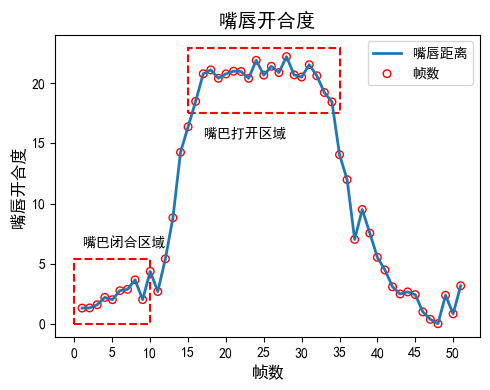

In [18]:
input_folder = (r"G:\myq_workspace\paperbackup\paper-stroke\experimen\dataset\199-211\201_6")
cal_landmarks_distance(input_folder, save_plot=True, output_path="D:\研究生文件记录\大论文资料汇总\图片\lip_distance_plot.svg")
